# Roget's Thesaurus (Embedding's Section Prediction)

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2024 <br>

## 1. About the notebook

The purpose of this notebook is to performe a part of the hole project (<b>Roget's Thesaurus in the 21st Century</b>) which is the section prediction of the embeddings we created in notebook <b>Roget's Data and Embeddings</b>

This Jupyter Notebook is focused on the application of machine learning models to predict the section of word embeddings previously generated from textual data extracted from Gutenberg's website.

## 2. Libraries

In [1]:
# Data Loading, Manipulation and Normalization
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from keras.utils import to_categorical

# Vector DB and Dimensionality Reduction
import faiss
from umap import UMAP

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank

# Split and Reports
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Machine Learning Models and Ensemble Models
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Model validation and Hyperparameter tuning
from sklearn.model_selection import cross_val_score
import optuna

# Save the model
from joblib import dump

# Deep learning
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Reshape, Dense, LSTM, GRU, Bidirectional
from tensorflow.keras.layers import LayerNormalization, Add, Dropout, BatchNormalization

# Mixed Presicion
from tensorflow.keras import mixed_precision

# Callbacks and Regularization
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

# Visualize the model's architecture
from keras.utils import plot_model

# Helper functions
import helper_functions as hf

2024-09-20 00:33:53.304494: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-20 00:33:53.566096: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-20 00:33:53.566129: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-20 00:33:53.609045: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-20 00:33:53.701136: I tensorflow/core/platform/cpu_feature_guar

In [2]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore')
warnings.filterwarnings("ignore", category=ConvergenceWarning)

## 3. Data loading and Preparation

### Words Loading

* Loading the word along with the classes and the embeddings

In [3]:
roget_words = pd.read_csv("Dataset/Roget's_Words.csv")
print(roget_words.shape)
roget_words.head()

(94214, 7)


,Class,Division,Section,Category,Sub-Category,Word,Final_Words
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,existence,"Existence, existence"
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,being,"Existence, being"
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,entity,"Existence, entity"
3,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,ens,"Existence, ens"
4,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,esse,"Existence, esse"


### VectorDB's Embeddings

* Retrieve the vectorDBs and the parameters

In [4]:
index_st = faiss.read_index('Embeddings/ST_vectordb.faiss')
index_use = faiss.read_index('Embeddings/USE_vectordb.faiss')
index_gemma2b = faiss.read_index('Embeddings/Gemma1.1_2B_vectordb.faiss')
index_gemma7b = faiss.read_index('Embeddings/Gemma1.1_7B_vectordb.faiss')

In [5]:
index_st.ntotal, index_use.ntotal, index_gemma2b.ntotal, index_gemma7b.ntotal

(94214, 94214, 94214, 94214)

In [6]:
d_st = index_st.d
d_use = index_use.d
d_gemma2b = index_gemma2b.d
d_gemma7b = index_gemma7b.d

d_st, d_use, d_gemma2b, d_gemma7b

(384, 512, 2048, 3072)

* Retrieve the embeddings

In [7]:
embeddings_st = np.zeros((index_st.ntotal, d_st), dtype=np.float32)
embeddings_use = np.zeros((index_use.ntotal, d_use), dtype=np.float32)
embeddings_gemma2b = np.zeros((index_gemma2b.ntotal, d_gemma2b), dtype=np.float32)
embeddings_gemma7b = np.zeros((index_gemma7b.ntotal, d_gemma7b), dtype=np.float32)

In [8]:
for i in range(index_st.ntotal):
    embeddings_st[i] = index_st.reconstruct(i)
    embeddings_use[i] = index_use.reconstruct(i)
    embeddings_gemma2b[i] = index_gemma2b.reconstruct(i)
    embeddings_gemma7b[i] = index_gemma7b.reconstruct(i)

In [9]:
scaler = StandardScaler()

embeddings_st = scaler.fit_transform(embeddings_st)
embeddings_use = scaler.fit_transform(embeddings_use)
embeddings_gemma2b = scaler.fit_transform(embeddings_gemma2b)
embeddings_gemma7b = scaler.fit_transform(embeddings_gemma7b)

In [10]:
embeddings_st = pd.DataFrame(embeddings_st)
embeddings_use = pd.DataFrame(embeddings_use)
embeddings_gemma2b = pd.DataFrame(embeddings_gemma2b)
embeddings_gemma7b = pd.DataFrame(embeddings_gemma7b)

## 4. Modeling

Seven different models where chosen in the section prediction notebook where with all these model we will follow a specific pattern to find the best parameters and optimize the accuracy. The pattern is the following:

We will first initialize the model without parameters in order to see the score it can hit without any optimization. Then we will use the optuna to modify some of the parameters and find the best combination. If the optuna goes better than the befault then we will take the parameters of the best trial that optuna had and train a model with this parameters. The best model that we will save will be the model with the highest score.

In [11]:
umap = UMAP(n_components=300, n_jobs=-1)
X = umap.fit_transform(embeddings_gemma7b)

y = roget_words['Section']

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=33)

### SGD

In [13]:
sgd = SGDClassifier(random_state=33)
sgd.fit(X_train, y_train)

SGDClassifier(random_state=33)

In [14]:
sgd.score(X_test, y_test)

0.7819211038386698

In [15]:
print(classification_report(y_test, sgd.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       1.00      0.60      0.75       355
                            SECTION I. EXISTENCE       1.00      0.25      0.39       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.91      0.88      0.89       797
                    SECTION I. MATTER IN GENERAL       1.00      0.73      0.85       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.61      0.71      0.66       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.00      0.00      0.00       123
                     SECTION I. SPACE IN GENERAL       0.98      0.79      0.88       444
                  SECTION I. VOLITION IN GENERAL       0.97      0.57      0.72       648
                          SECTION II. DIMENSIONS       0.89      0.90      0.90      1259
                    SECTION II. INORGANIC MATTER       0.99      0.83      0.90       676
         

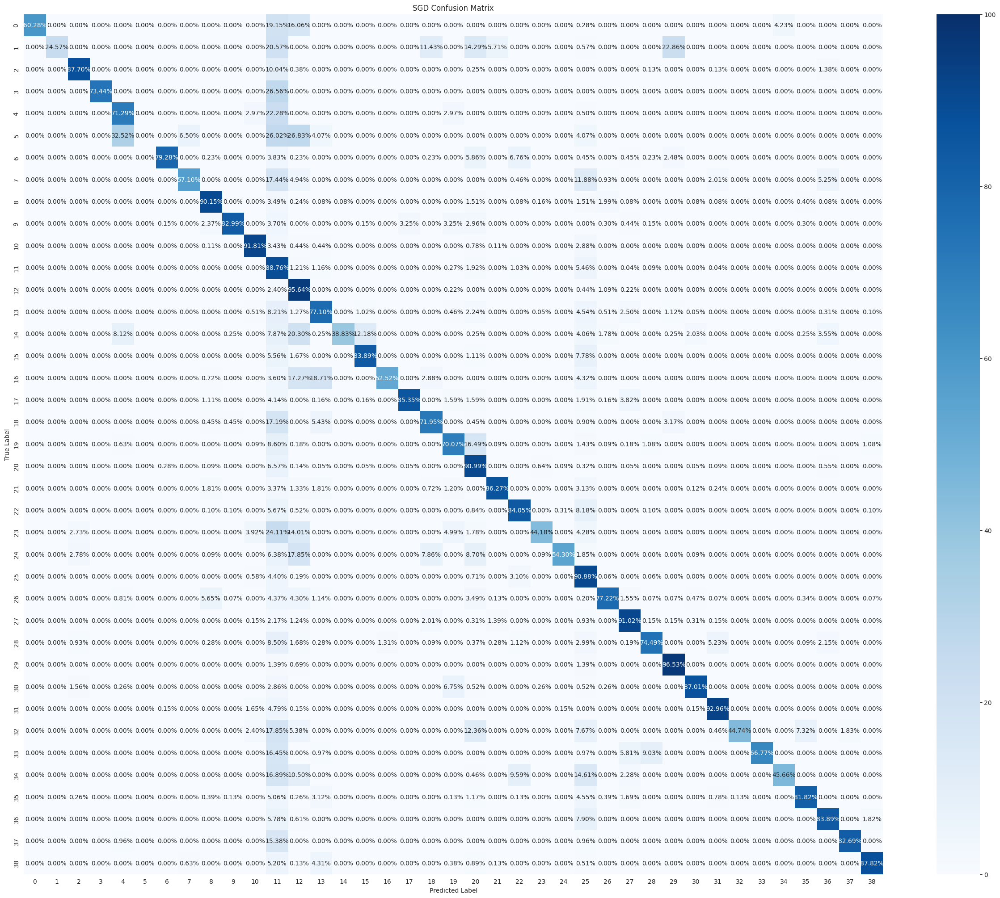

In [16]:
hf.confusion_matrix_plot(y_test, sgd.predict(X_test), 'SGD', 'Section/SGD_cm', figsize=(31,25))

In [17]:
def objective_sgd_section(trial):

    params = {
        'alpha': trial.suggest_float('alpha', 0.01, 1),
        'epsilon': trial.suggest_float('epsilon', 0.01, 1),
        'l1_ratio': trial.suggest_float('l1_ratio', 0.01, 1),
        'penalty': trial.suggest_categorical('penalty', [None, 'l1', 'l2']),
        'warm_start': trial.suggest_categorical('warm_start', [True, False]),
        'max_iter': trial.suggest_int('max_iter', 50, 250),
        'random_state': 33
    }
    
    sgd = SGDClassifier(**params)

    score = cross_val_score(sgd, X_train, y_train.to_numpy(), cv=5, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [18]:
study_sgd = optuna.create_study(direction="maximize")
study_sgd.optimize(objective_sgd_section, n_trials=30, n_jobs=-1)

[I 2024-09-20 00:44:24,710] A new study created in memory with name: no-name-cdbfa76d-bb2e-473d-86a6-57b795c6d30f
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceW

In [19]:
print('Best trial:')
trial = study_sgd.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.698433599437949
Params: 
  alpha: 0.010766717516822233
  epsilon: 0.01076954329818286
  l1_ratio: 0.33736252076862294
  penalty: None
  warm_start: True
  max_iter: 178


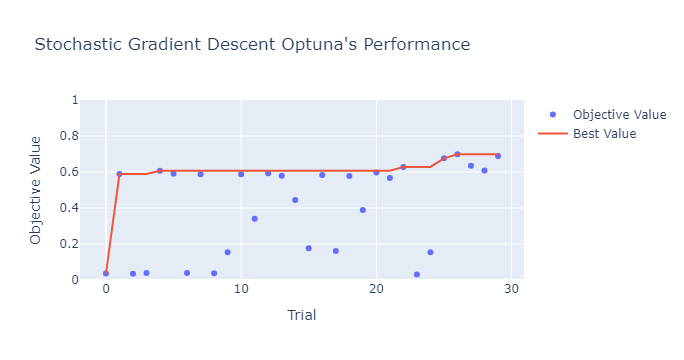

In [20]:
fig = plot_optimization_history(study_sgd)

fig.update_layout(yaxis_range=[0, 1], title="Stochastic Gradient Descent Optuna's Performance")
fig.show()

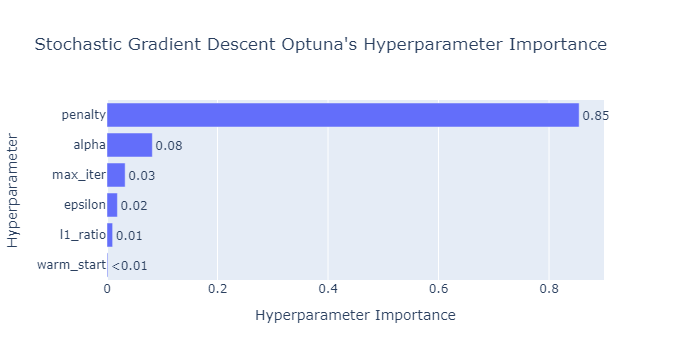

In [21]:
fig = plot_param_importances(study_sgd)

fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparameter Importance")
fig.show()

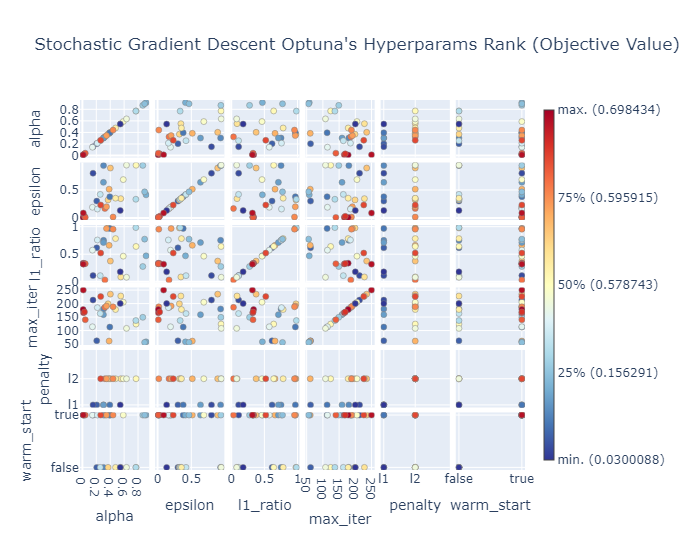

In [22]:
fig = plot_rank(study_sgd)
fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [23]:
sgd_section = SGDClassifier(**study_sgd.best_trial.params, random_state=33)
sgd_section.fit(X_train, y_train)

SGDClassifier(alpha=0.010766717516822233, epsilon=0.01076954329818286,
              l1_ratio=0.33736252076862294, max_iter=178, penalty=None,
              random_state=33, warm_start=True)

In [24]:
sgd_section.score(X_test, y_test)

0.7051477091809658

In [25]:
print(classification_report(y_test, sgd_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.96      0.60      0.74       355
                            SECTION I. EXISTENCE       0.37      0.60      0.46       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.85      0.79      0.82       797
                    SECTION I. MATTER IN GENERAL       1.00      0.73      0.85       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.49      0.38      0.43       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.00      0.00      0.00       123
                     SECTION I. SPACE IN GENERAL       0.72      0.77      0.75       444
                  SECTION I. VOLITION IN GENERAL       0.89      0.46      0.61       648
                          SECTION II. DIMENSIONS       0.84      0.79      0.81      1259
                    SECTION II. INORGANIC MATTER       0.88      0.80      0.84       676
         

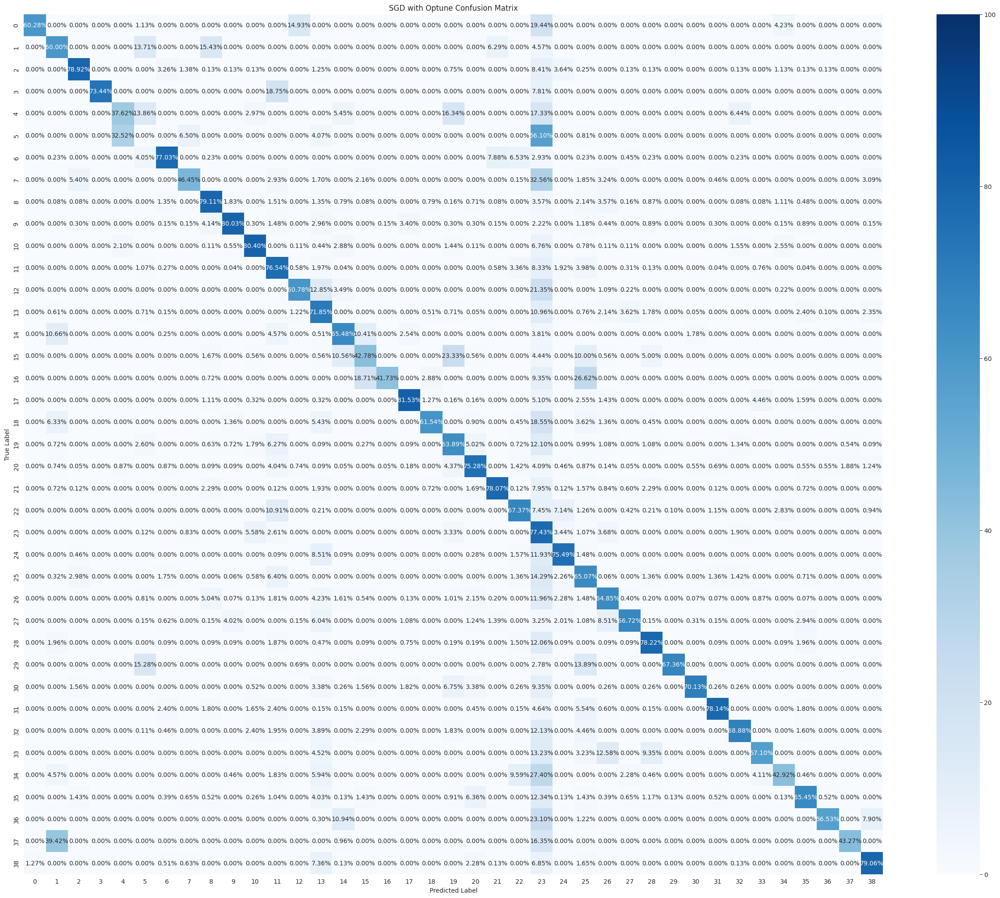

In [26]:
hf.confusion_matrix_plot(y_test, sgd_section.predict(X_test), 'SGD with Optune', 'Section/SGD_cm_optuna', figsize=(31,25))

### SVC

In [27]:
svc = SVC(max_iter=150, random_state=33)
svc.fit(X_train, y_train)

SVC(max_iter=150, random_state=33)

In [28]:
svc.score(X_test, y_test)

0.5725809304793915

In [29]:
print(classification_report(y_test, svc.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.72      0.95      0.82       355
                            SECTION I. EXISTENCE       0.93      0.89      0.91       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.72      0.62      0.66       797
                    SECTION I. MATTER IN GENERAL       0.67      0.92      0.78       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.79      0.82      0.81       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.57      0.63      0.60       123
                     SECTION I. SPACE IN GENERAL       0.84      0.93      0.88       444
                  SECTION I. VOLITION IN GENERAL       0.70      0.20      0.31       648
                          SECTION II. DIMENSIONS       0.82      0.93      0.87      1259
                    SECTION II. INORGANIC MATTER       0.56      0.92      0.70       676
         

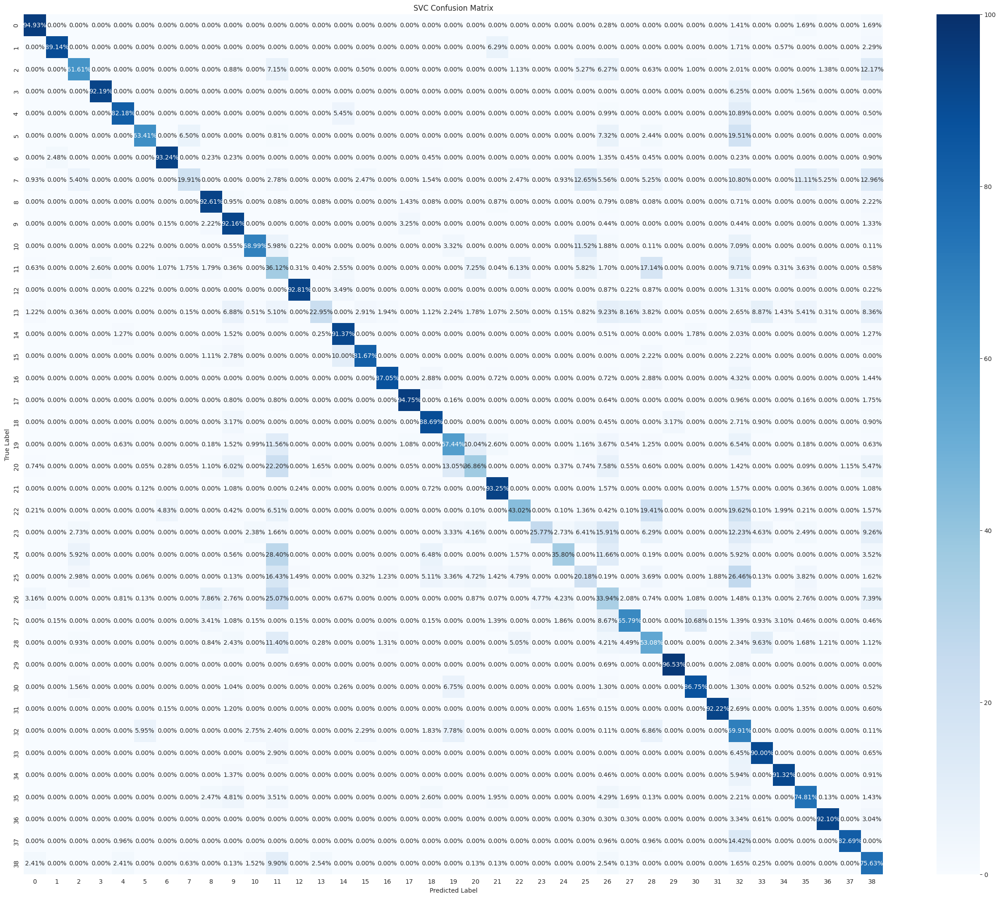

In [30]:
hf.confusion_matrix_plot(y_test, svc.predict(X_test), 'SVC', 'Section/SVC_cm', figsize=(31,25))

In [31]:
def objective_svc_section(trial):
    params = {
        'C': trial.suggest_float('C', 0.01, 1),
        'kernel': trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf']),
        'gamma': trial.suggest_categorical('gamma', ['scale', 'auto']),
        'degree': trial.suggest_int('degree', 2, 6),
        'max_iter': 150,
        'random_state': 33
    }
    
    svc = SVC(**params)

    score = cross_val_score(svc, X_train, y_train.to_numpy(), scoring='accuracy', cv=3, n_jobs=-1)
    return score.mean()

In [32]:
study_svc = optuna.create_study(direction="maximize")
study_svc.optimize(objective_svc_section, n_trials=10, n_jobs=-1)

[I 2024-09-20 00:58:28,889] A new study created in memory with name: no-name-3fd2443b-d14c-4f63-a2af-d3874ff60ee5
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing yo

In [33]:
print('Best trial:')
trial = study_svc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.741330421992752
Params: 
  C: 0.14806256072035245
  kernel: linear
  gamma: auto
  degree: 4


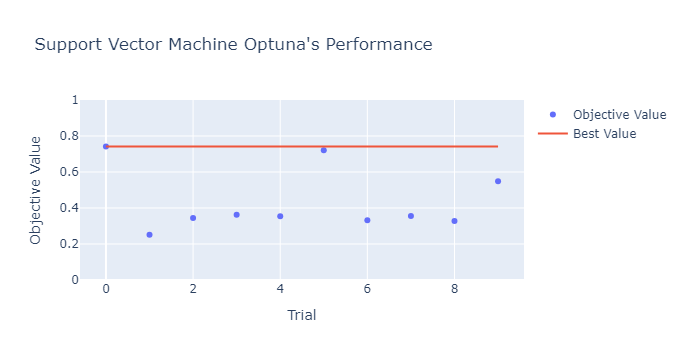

In [34]:
fig = plot_optimization_history(study_svc)
fig.update_layout(yaxis_range=[0, 1], title="Support Vector Machine Optuna's Performance")
fig.show()

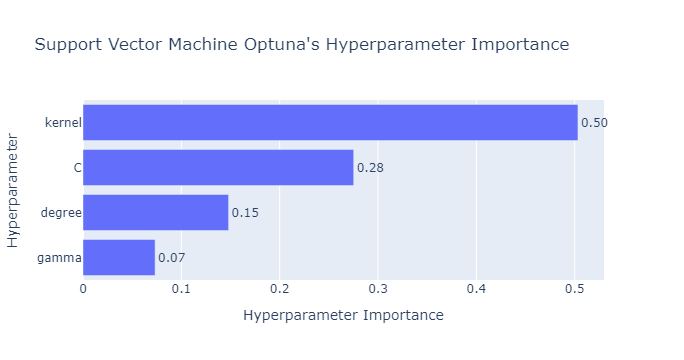

In [35]:
fig = plot_param_importances(study_svc)
fig.update_layout(title="Support Vector Machine Optuna's Hyperparameter Importance")
fig.show()

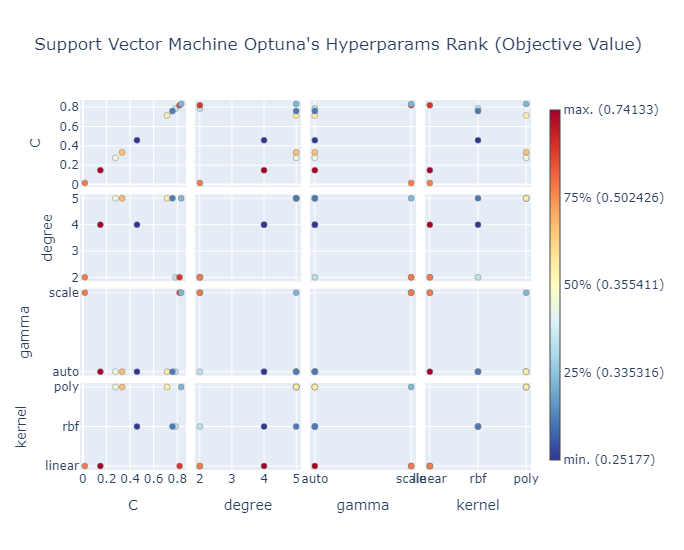

In [36]:
fig = plot_rank(study_svc)
fig.update_layout(title="Support Vector Machine Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [37]:
svc_section = SVC(**study_svc.best_trial.params, max_iter=200, random_state=33)
svc_section.fit(X_train, y_train)

SVC(C=0.14806256072035245, degree=4, gamma='auto', kernel='linear',
    max_iter=200, random_state=33)

In [38]:
svc_section.score(X_test, y_test)

0.7439943392888732

In [39]:
print(classification_report(y_test, svc_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.82      0.97      0.89       355
                            SECTION I. EXISTENCE       0.92      0.95      0.94       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.88      0.90      0.89       797
                    SECTION I. MATTER IN GENERAL       0.31      0.92      0.47       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.85      0.93      0.89       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.43      0.81      0.56       123
                     SECTION I. SPACE IN GENERAL       0.79      0.96      0.87       444
                  SECTION I. VOLITION IN GENERAL       0.78      0.70      0.74       648
                          SECTION II. DIMENSIONS       0.88      0.64      0.74      1259
                    SECTION II. INORGANIC MATTER       0.85      0.92      0.89       676
         

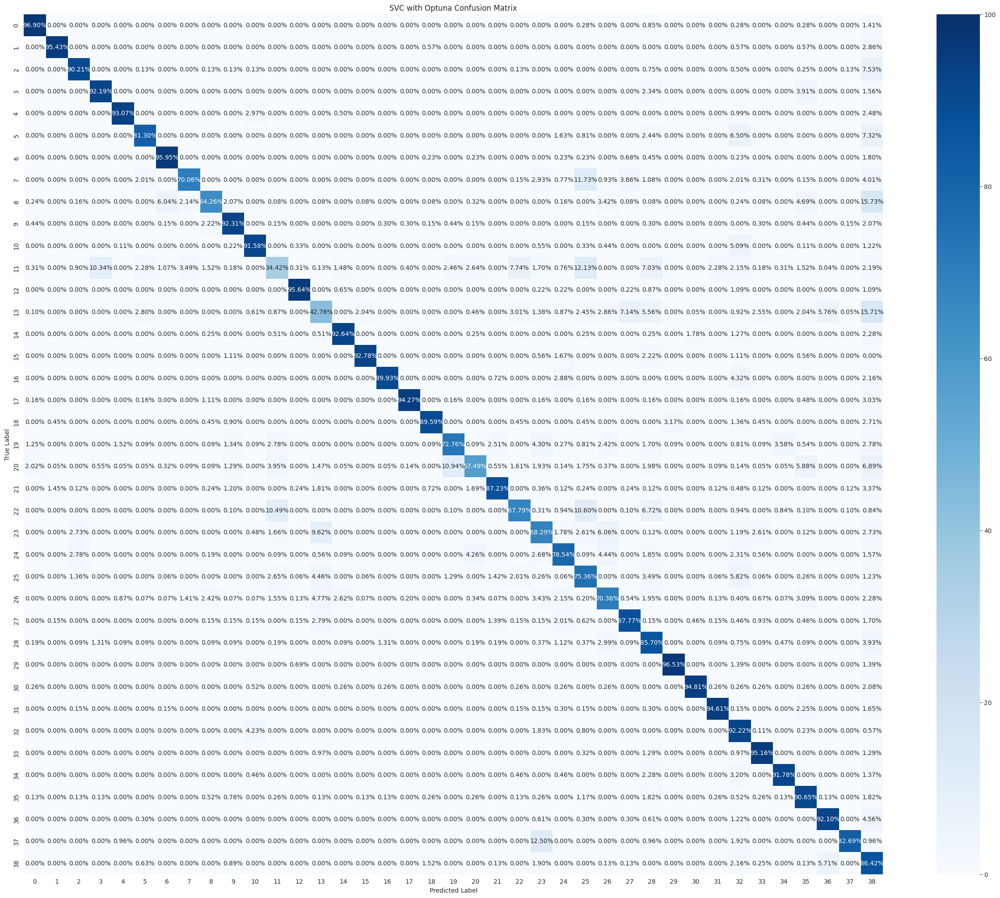

In [40]:
hf.confusion_matrix_plot(y_test, svc_section.predict(X_test), 'SVC with Optuna', 'Section/SVC_cm_optuna', figsize=(31,25))

### Random Forest

In [41]:
rf = RandomForestClassifier(random_state=33)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=33)

In [42]:
rf.score(X_test, y_test)

0.9660003537944454

In [43]:
print(classification_report(y_test, rf.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.98      0.99       355
                            SECTION I. EXISTENCE       0.99      0.98      0.99       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.98      0.98      0.98       797
                    SECTION I. MATTER IN GENERAL       1.00      0.96      0.98       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.99      0.97      0.98       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.94      0.91      0.93       123
                     SECTION I. SPACE IN GENERAL       0.99      0.98      0.98       444
                  SECTION I. VOLITION IN GENERAL       0.96      0.96      0.96       648
                          SECTION II. DIMENSIONS       0.97      0.97      0.97      1259
                    SECTION II. INORGANIC MATTER       0.91      0.95      0.93       676
         

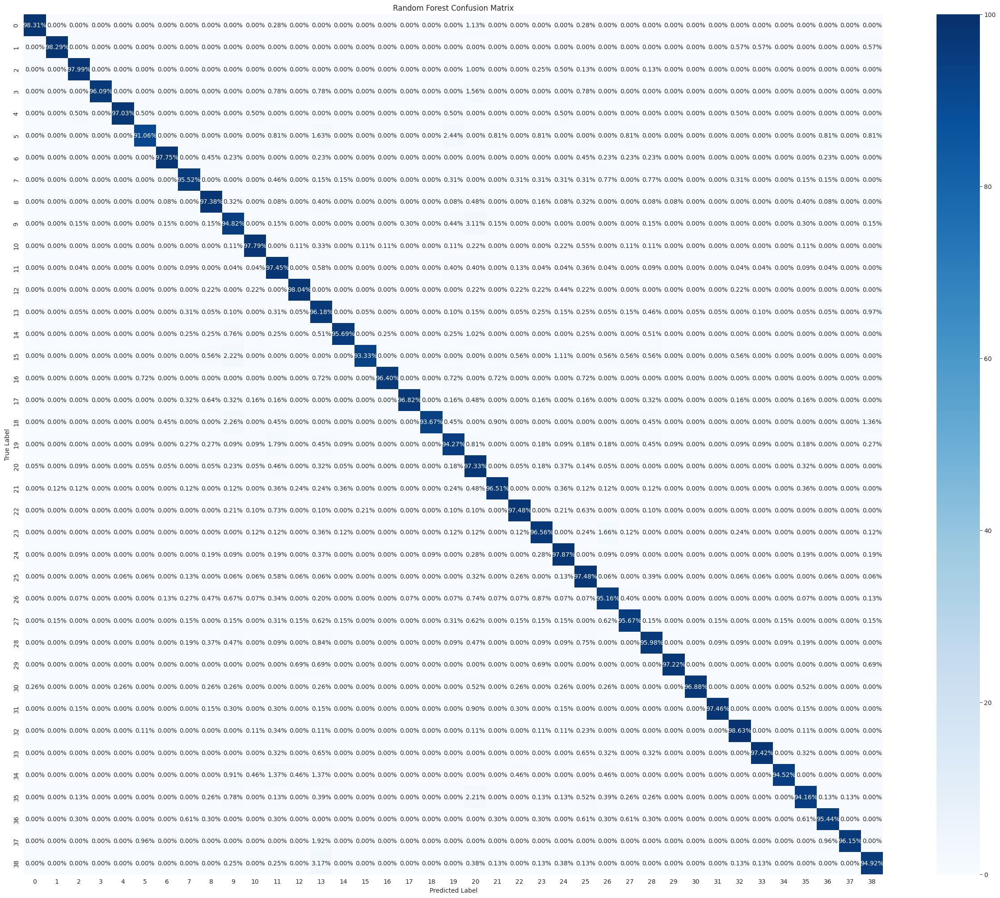

In [44]:
hf.confusion_matrix_plot(y_test, rf.predict(X_test), 'Random Forest', 'Section/RF_cm', figsize=(31,25))

In [45]:
def objective_rf_section(trial):

    params = {
        'n_estimators': trial.suggest_int('n_estimators', low=50, high=250, step=50),
        'max_depth': trial.suggest_int('max_depth', 1, 25),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'n_jobs': -1,
        'random_state': 33
    }
    
    rfc_optuna = RandomForestClassifier(**params)

    score = cross_val_score(rfc_optuna, X_train, y_train, scoring='accuracy', cv=3, n_jobs=-1)
    return score.mean()

In [46]:
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf_section, n_trials=10)

[I 2024-09-20 01:10:34,429] A new study created in memory with name: no-name-feda4fbf-7bc8-445b-8800-5555e172d7b3
[I 2024-09-20 01:11:04,838] Trial 0 finished with value: 0.944396427542495 and parameters: {'n_estimators': 100, 'max_depth': 19, 'min_samples_split': 4, 'min_samples_leaf': 2, 'bootstrap': False}. Best is trial 0 with value: 0.944396427542495.
[I 2024-09-20 01:11:35,113] Trial 1 finished with value: 0.9475048901423828 and parameters: {'n_estimators': 150, 'max_depth': 22, 'min_samples_split': 6, 'min_samples_leaf': 5, 'bootstrap': True}. Best is trial 1 with value: 0.9475048901423828.
[I 2024-09-20 01:12:26,494] Trial 2 finished with value: 0.9503252513305737 and parameters: {'n_estimators': 250, 'max_depth': 23, 'min_samples_split': 5, 'min_samples_leaf': 3, 'bootstrap': True}. Best is trial 2 with value: 0.9503252513305737.
[I 2024-09-20 01:12:35,309] Trial 3 finished with value: 0.9213938043033254 and parameters: {'n_estimators': 50, 'max_depth': 14, 'min_samples_split'

In [47]:
print('Best trial:')
trial = study_rf.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9503252513305737
Params: 
  n_estimators: 250
  max_depth: 23
  min_samples_split: 5
  min_samples_leaf: 3
  bootstrap: True


In [48]:
fig = plot_optimization_history(study_rf)
fig.update_layout(yaxis_range=[0, 1], title="Random Forest Optuna's Performance")
fig.show()

In [49]:
fig = plot_param_importances(study_rf)
fig.update_layout(title="Random Forest Optuna's Hyperparameter Importance")
fig.show()

In [50]:
fig = plot_rank(study_rf)
fig.update_layout(title="Random Forest Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [51]:
rf_section = RandomForestClassifier(**study_rf.best_trial.params, random_state=33, n_jobs=-1)
rf_section.fit(X_train, y_train)

RandomForestClassifier(max_depth=23, min_samples_leaf=3, min_samples_split=5,
                       n_estimators=250, n_jobs=-1, random_state=33)

In [52]:
rf_section.score(X_test, y_test)

0.9536883070935787

In [53]:
print(classification_report(y_test, rf_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       1.00      0.96      0.98       355
                            SECTION I. EXISTENCE       0.99      0.96      0.97       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.99      0.96      0.98       797
                    SECTION I. MATTER IN GENERAL       1.00      0.91      0.96       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.99      0.97      0.98       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.99      0.81      0.89       123
                     SECTION I. SPACE IN GENERAL       1.00      0.96      0.98       444
                  SECTION I. VOLITION IN GENERAL       0.99      0.93      0.96       648
                          SECTION II. DIMENSIONS       0.99      0.95      0.97      1259
                    SECTION II. INORGANIC MATTER       0.92      0.95      0.94       676
         

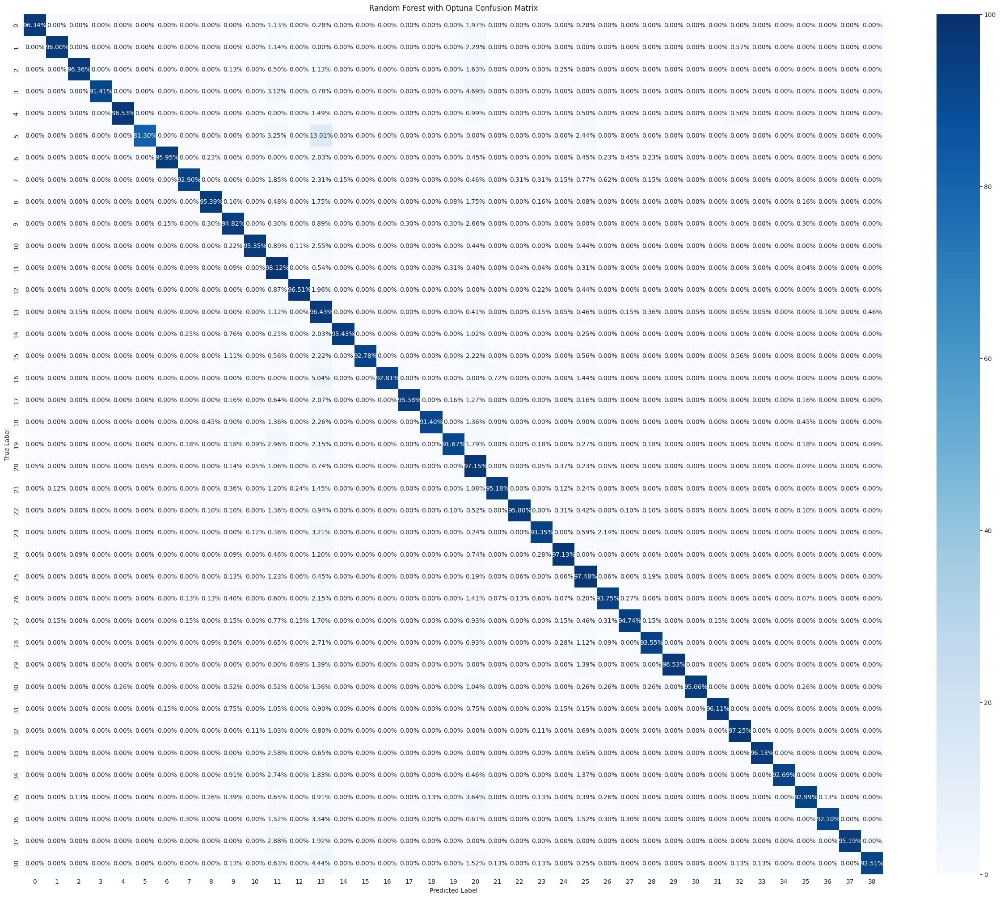

In [54]:
hf.confusion_matrix_plot(y_test, rf_section.predict(X_test), 'Random Forest with Optuna', 'Section/RF_cm_optuna', figsize=(31,25))

### AdaBoost

In [55]:
adaboost = AdaBoostClassifier(random_state=33)
adaboost.fit(X_train, y_train)

AdaBoostClassifier(random_state=33)

In [56]:
adaboost.score(X_test, y_test)

0.19062444719617902

In [57]:
print(classification_report(y_test, adaboost.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.10      0.17      0.12       355
                            SECTION I. EXISTENCE       1.00      0.23      0.37       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.24      0.22      0.23       797
                    SECTION I. MATTER IN GENERAL       1.00      0.21      0.35       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.00      0.00      0.00       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.00      0.00      0.00       123
                     SECTION I. SPACE IN GENERAL       0.76      0.31      0.44       444
                  SECTION I. VOLITION IN GENERAL       0.23      0.14      0.17       648
                          SECTION II. DIMENSIONS       0.20      0.22      0.21      1259
                    SECTION II. INORGANIC MATTER       0.27      0.10      0.15       676
         

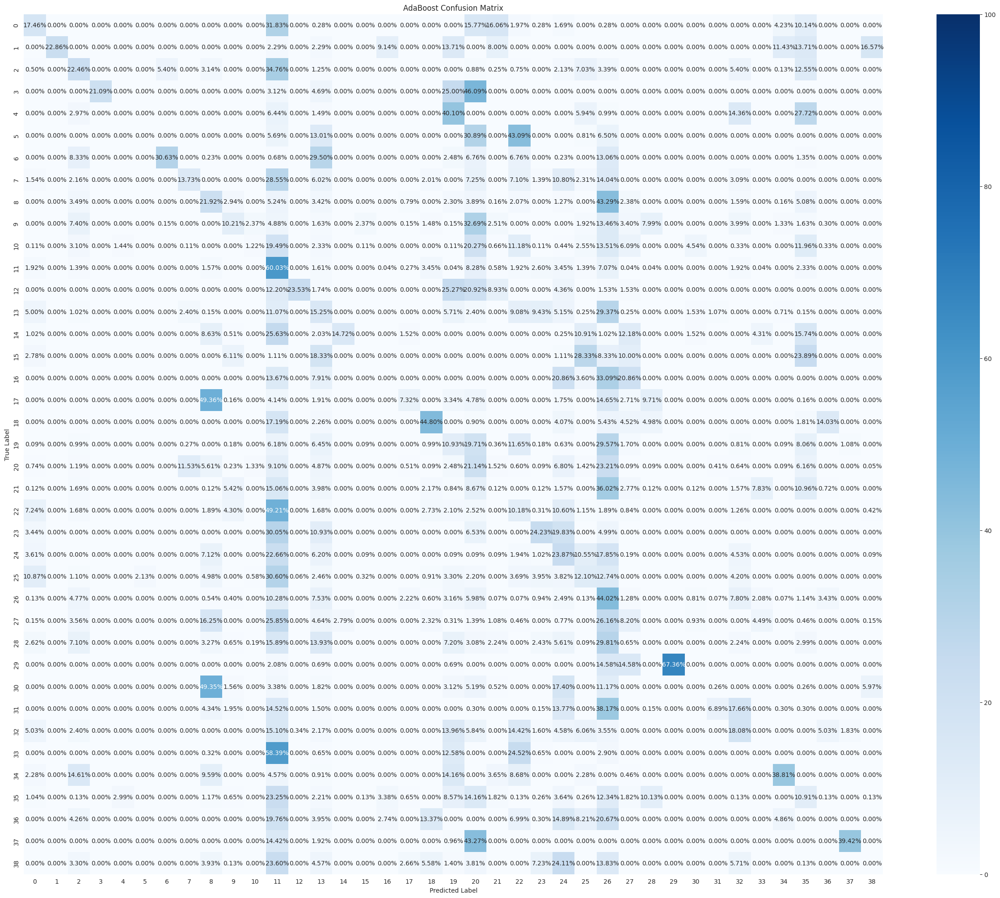

In [58]:
hf.confusion_matrix_plot(y_test, adaboost.predict(X_test), 'AdaBoost', 'Section/AdaBoost_cm', figsize=(31,25))

In [59]:
def objective_ada_section(trial):
    params_estimator = {
        'max_depth': trial.suggest_int('max_depth', 1, 15),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 4),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 15),
        'max_features': trial.suggest_int('max_features', 20, 50),
        'random_state': 33        
    }
    estimator = DecisionTreeClassifier(**params_estimator)
    
    params = {
        'estimator': estimator,
        'n_estimators': trial.suggest_int('n_estimators', 50, 150, step=25),
        'algorithm': 'SAMME',
        # 'learning_rate': trial.suggest_float('learning_rate', .01, .05),
        'random_state': 33
    }
    adaboost = AdaBoostClassifier(**params)
    
    score = cross_val_score(adaboost,
                            X_train,
                            y_train,
                            scoring='accuracy',
                            cv=3,
                            n_jobs=-1)

    return score.mean()

In [60]:
study_adaboost = optuna.create_study(direction='maximize')
study_adaboost.optimize(objective_ada_section, n_trials=10)

[I 2024-09-20 01:17:17,158] A new study created in memory with name: no-name-a10dae91-cb6e-4bcc-859c-c6c0e6f1d5f7
[I 2024-09-20 01:17:38,926] Trial 0 finished with value: 0.12740147689881576 and parameters: {'max_depth': 1, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 40, 'n_estimators': 75}. Best is trial 0 with value: 0.12740147689881576.
[I 2024-09-20 01:24:58,209] Trial 1 finished with value: 0.9626681223369573 and parameters: {'max_depth': 12, 'min_samples_split': 2, 'min_samples_leaf': 5, 'max_features': 50, 'n_estimators': 150}. Best is trial 1 with value: 0.9626681223369573.
[I 2024-09-20 01:31:06,662] Trial 2 finished with value: 0.9632443251603512 and parameters: {'max_depth': 15, 'min_samples_split': 2, 'min_samples_leaf': 15, 'max_features': 39, 'n_estimators': 150}. Best is trial 2 with value: 0.9632443251603512.
[I 2024-09-20 01:33:28,012] Trial 3 finished with value: 0.9577552351059152 and parameters: {'max_depth': 11, 'min_samples_split': 2, 'min_sampl

In [61]:
print('Best trial:')
trial = study_adaboost.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9632443251603512
Params: 
  max_depth: 15
  min_samples_split: 2
  min_samples_leaf: 15
  max_features: 39
  n_estimators: 150


In [62]:
trials_df = study_adaboost.trials_dataframe()
trials_df.sort_values(by='value', ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_max_depth,params_max_features,params_min_samples_leaf,params_min_samples_split,params_n_estimators,state
2,2,0.963244,2024-09-20 01:24:58.209934,2024-09-20 01:31:06.662390,0 days 00:06:08.452456,15,39,15,2,150,COMPLETE
1,1,0.962668,2024-09-20 01:17:38.927065,2024-09-20 01:24:58.208927,0 days 00:07:19.281862,12,50,5,2,150,COMPLETE
7,7,0.959090,2024-09-20 01:37:02.079292,2024-09-20 01:38:43.009482,0 days 00:01:40.930190,11,24,13,2,75,COMPLETE
3,3,0.957755,2024-09-20 01:31:06.663686,2024-09-20 01:33:28.012402,0 days 00:02:21.348716,11,49,4,2,50,COMPLETE
8,8,0.948036,2024-09-20 01:38:43.010389,2024-09-20 01:40:42.937726,0 days 00:01:59.927337,8,21,3,2,125,COMPLETE
9,9,0.886139,2024-09-20 01:40:42.938535,2024-09-20 01:45:19.592120,0 days 00:04:36.653585,7,44,15,4,150,COMPLETE
5,5,0.467740,2024-09-20 01:34:20.723007,2024-09-20 01:36:50.970426,0 days 00:02:30.247419,4,49,12,4,125,COMPLETE
4,4,0.411242,2024-09-20 01:33:28.013512,2024-09-20 01:34:20.722060,0 days 00:00:52.708548,4,28,4,2,75,COMPLETE
6,6,0.156318,2024-09-20 01:36:50.971839,2024-09-20 01:37:02.078256,0 days 00:00:11.106417,1,29,7,3,50,COMPLETE
0,0,0.127401,2024-09-20 01:17:17.159690,2024-09-20 01:17:38.926265,0 days 00:00:21.766575,1,40,6,2,75,COMPLETE


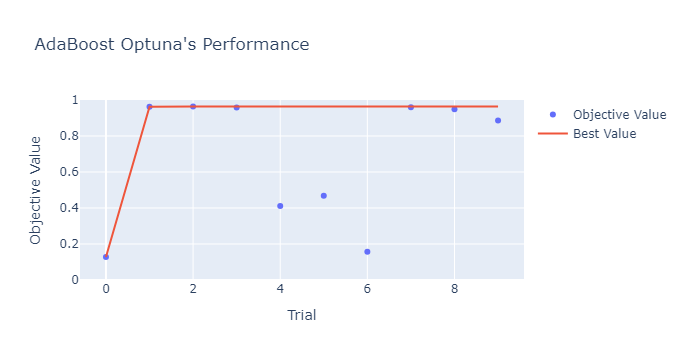

In [63]:
fig = plot_optimization_history(study_adaboost)
fig.update_layout(yaxis_range=[0, 1], title="AdaBoost Optuna's Performance")
fig.show()

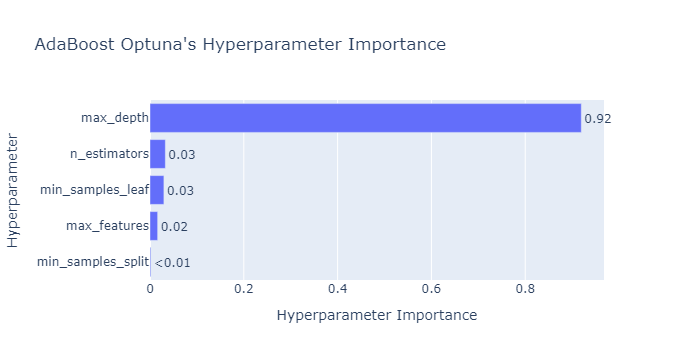

In [64]:
fig = plot_param_importances(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparameter Importance")
fig.show()

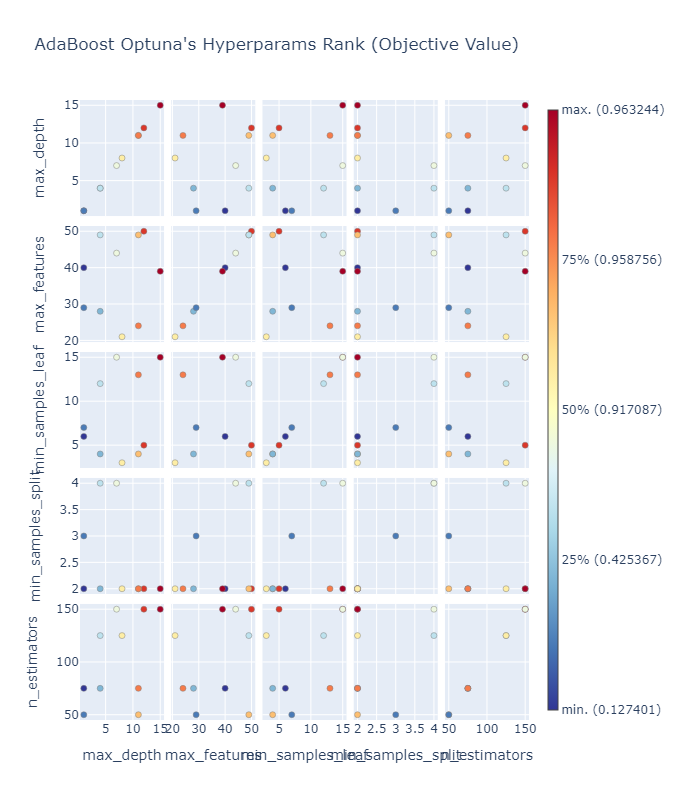

In [65]:
fig = plot_rank(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparams Rank (Objective Value)", height=800)
fig.show()

In [66]:
params_estimator = {
        'max_depth': None,
        'min_samples_split': None,
        'min_samples_leaf': None,
        'max_features': None,
        'random_state': 33        
}

params = {
    'estimator': None,
    'n_estimators': None,
    'algorithm': 'SAMME',
    'random_state': 33
}
for i, key in enumerate(trial.params.items()):
    if i < 4:
        params_estimator[key[0]] = key[1]
    else:
        params[key[0]] = key[1]

In [67]:
estimator = DecisionTreeClassifier(**params_estimator)
params['estimator'] = estimator

adaboost_section = AdaBoostClassifier(**params)
adaboost_section.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=15,
                                                    max_features=39,
                                                    min_samples_leaf=15,
                                                    random_state=33),
                   n_estimators=150, random_state=33)

In [68]:
adaboost_section.score(X_test, y_test)

0.9660003537944454

In [69]:
print(classification_report(y_test, adaboost_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.98      0.99       355
                            SECTION I. EXISTENCE       0.99      0.98      0.99       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.98      0.97      0.98       797
                    SECTION I. MATTER IN GENERAL       1.00      0.95      0.98       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.99      0.97      0.98       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.98      0.90      0.94       123
                     SECTION I. SPACE IN GENERAL       0.99      0.98      0.99       444
                  SECTION I. VOLITION IN GENERAL       0.96      0.96      0.96       648
                          SECTION II. DIMENSIONS       0.97      0.97      0.97      1259
                    SECTION II. INORGANIC MATTER       0.94      0.95      0.94       676
         

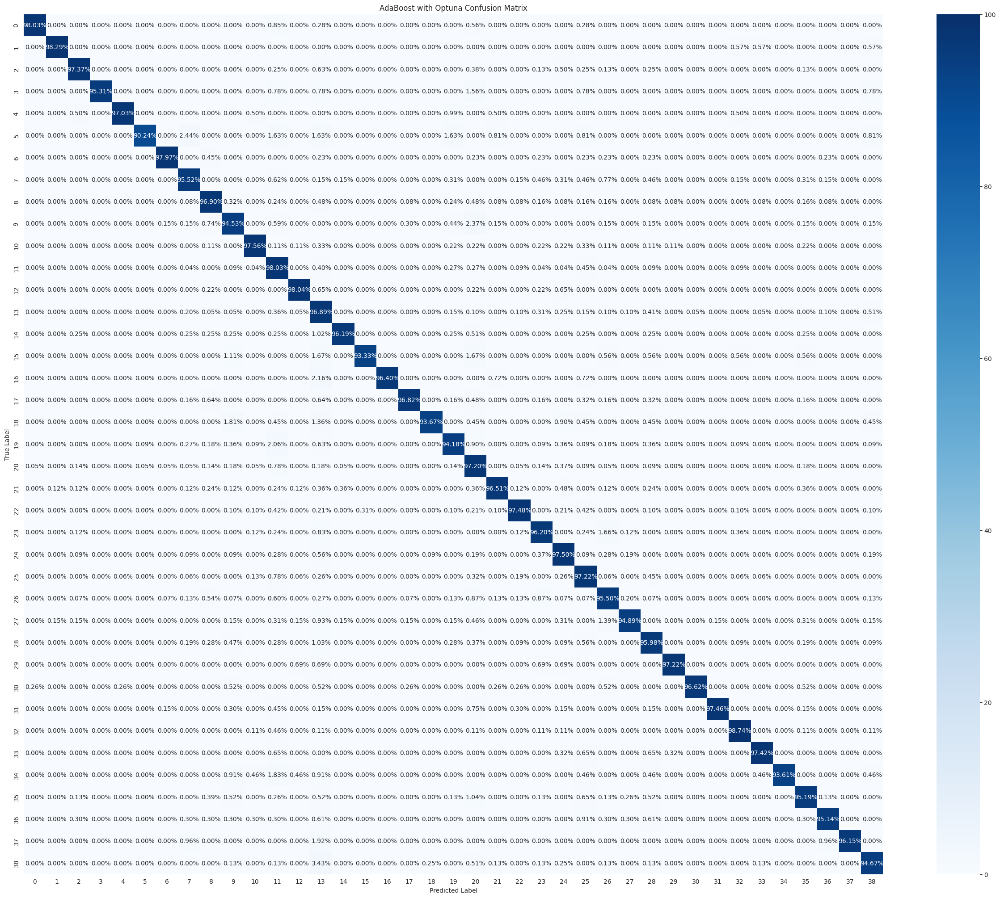

In [70]:
hf.confusion_matrix_plot(y_test, adaboost_section.predict(X_test), 'AdaBoost with Optuna', 'Section/AdaBoost_cm_optuna', figsize=(31,25))

### Extra Trees

In [71]:
etc = ExtraTreesClassifier()
etc.fit(X_train, y_train)

ExtraTreesClassifier()

In [72]:
etc.score(X_test, y_test)

0.9666371837962144

In [73]:
print(classification_report(y_test, etc.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.99      0.99       355
                            SECTION I. EXISTENCE       0.99      0.98      0.99       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.98      0.98      0.98       797
                    SECTION I. MATTER IN GENERAL       0.98      0.96      0.97       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.99      0.98      0.98       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.96      0.92      0.94       123
                     SECTION I. SPACE IN GENERAL       0.98      0.98      0.98       444
                  SECTION I. VOLITION IN GENERAL       0.96      0.96      0.96       648
                          SECTION II. DIMENSIONS       0.98      0.97      0.98      1259
                    SECTION II. INORGANIC MATTER       0.88      0.97      0.92       676
         

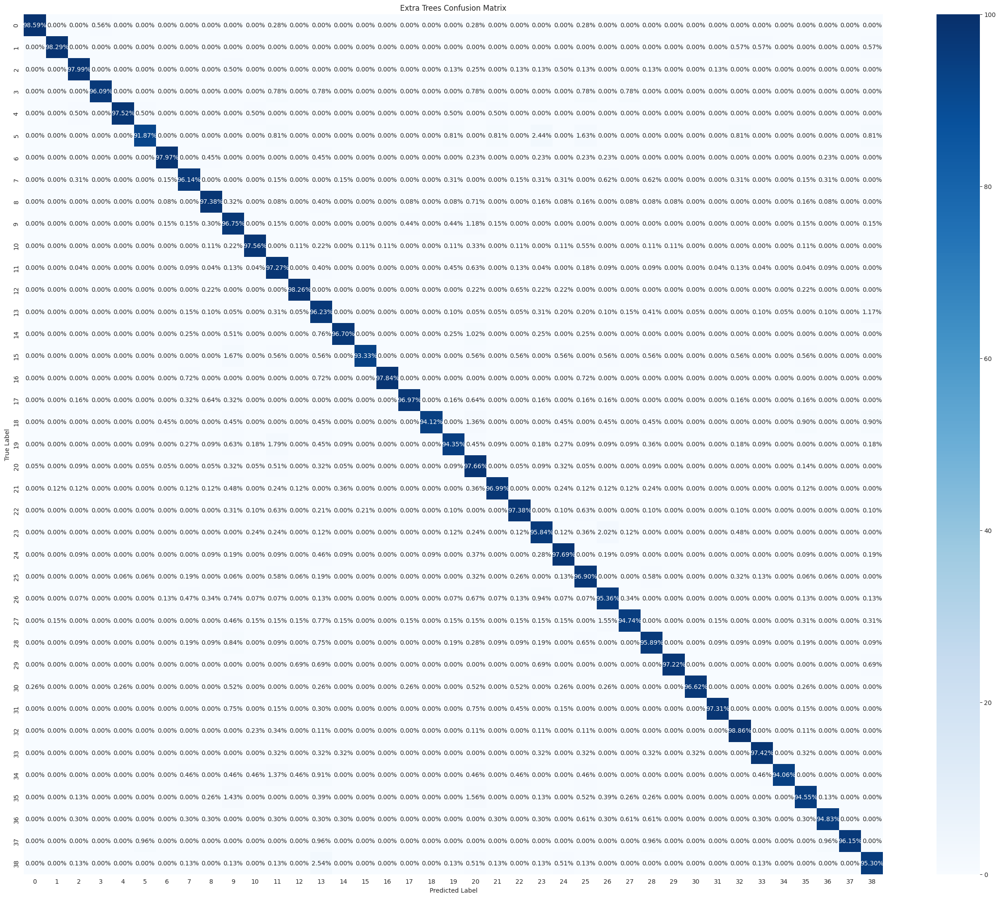

In [74]:
hf.confusion_matrix_plot(y_test, etc.predict(X_test), 'Extra Trees', 'Section/ExtraTrees_cm', figsize=(31,25))

In [75]:
def objective_etc_section(trial):
    max_depth_categ = np.linspace(5, 20, 10).astype(int).tolist()
    max_depth_categ.append(None)

    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 125, step=25),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss']),
        'max_depth': trial.suggest_categorical('max_depth', max_depth_categ),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 4),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
    }
    etc_optuna = ExtraTreesClassifier(**params)

    score = cross_val_score(etc_optuna, X_train, y_train, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [76]:
study_etc = optuna.create_study(direction='maximize')
study_etc.optimize(objective_etc_section, n_trials=10)

[I 2024-09-20 01:54:49,647] A new study created in memory with name: no-name-44bb6700-a0f6-4125-aba9-12e0d9cdc1bc
[I 2024-09-20 01:54:57,266] Trial 0 finished with value: 0.9077923850247919 and parameters: {'n_estimators': 125, 'criterion': 'log_loss', 'max_depth': 11, 'min_samples_split': 3, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.9077923850247919.
[I 2024-09-20 01:55:02,958] Trial 1 finished with value: 0.908641526027688 and parameters: {'n_estimators': 75, 'criterion': 'gini', 'max_depth': 18, 'min_samples_split': 3, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.908641526027688.
[I 2024-09-20 01:55:05,462] Trial 2 finished with value: 0.3343947595869536 and parameters: {'n_estimators': 125, 'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.908641526027688.
[I 2024-09-20 01:55:09,553] Trial 3 finished with value: 0.9260792430514488 and parameters: {'n_estimators': 100, 'criterion': 'log_loss', '

In [77]:
print('Best trial:')
trial = study_etc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9532214286797375
Params: 
  n_estimators: 125
  criterion: log_loss
  max_depth: 16
  min_samples_split: 4
  max_features: sqrt


In [78]:
trials_df = study_etc.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_criterion,params_max_depth,params_max_features,params_min_samples_split,params_n_estimators,state
9,9,0.953221,2024-09-20 01:55:24.759110,2024-09-20 01:55:32.194906,0 days 00:00:07.435796,log_loss,16,sqrt,4,125,COMPLETE
3,3,0.926079,2024-09-20 01:55:05.463452,2024-09-20 01:55:09.553256,0 days 00:00:04.089804,log_loss,15,log2,2,100,COMPLETE
1,1,0.908642,2024-09-20 01:54:57.267806,2024-09-20 01:55:02.958017,0 days 00:00:05.690211,gini,18,sqrt,3,75,COMPLETE
0,0,0.907792,2024-09-20 01:54:49.648630,2024-09-20 01:54:57.266545,0 days 00:00:07.617915,log_loss,11,sqrt,3,125,COMPLETE
4,4,0.907732,2024-09-20 01:55:09.554362,2024-09-20 01:55:15.996851,0 days 00:00:06.442489,log_loss,11,sqrt,3,125,COMPLETE


In [79]:
fig = plot_optimization_history(study_etc)
fig.update_layout(yaxis_range=[0, 1], title="Extra Tree Optuna's Performance", width=930, height=550)
fig.show()

In [80]:
fig = plot_rank(study_etc)
fig.update_layout(title="Extra Tree Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [81]:
etc_section = ExtraTreesClassifier(**study_etc.best_trial.params)
etc_section.fit(X_train, y_train)

ExtraTreesClassifier(criterion='log_loss', max_depth=16, min_samples_split=4,
                     n_estimators=125)

In [82]:
etc_section.score(X_test, y_test)

0.9539359632053777

In [83]:
print(classification_report(y_test, etc_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.97      0.98       355
                            SECTION I. EXISTENCE       0.99      0.96      0.98       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.99      0.96      0.98       797
                    SECTION I. MATTER IN GENERAL       1.00      0.91      0.95       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.99      0.97      0.98       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.99      0.81      0.89       123
                     SECTION I. SPACE IN GENERAL       1.00      0.96      0.98       444
                  SECTION I. VOLITION IN GENERAL       0.99      0.92      0.95       648
                          SECTION II. DIMENSIONS       0.99      0.96      0.97      1259
                    SECTION II. INORGANIC MATTER       0.91      0.95      0.93       676
         

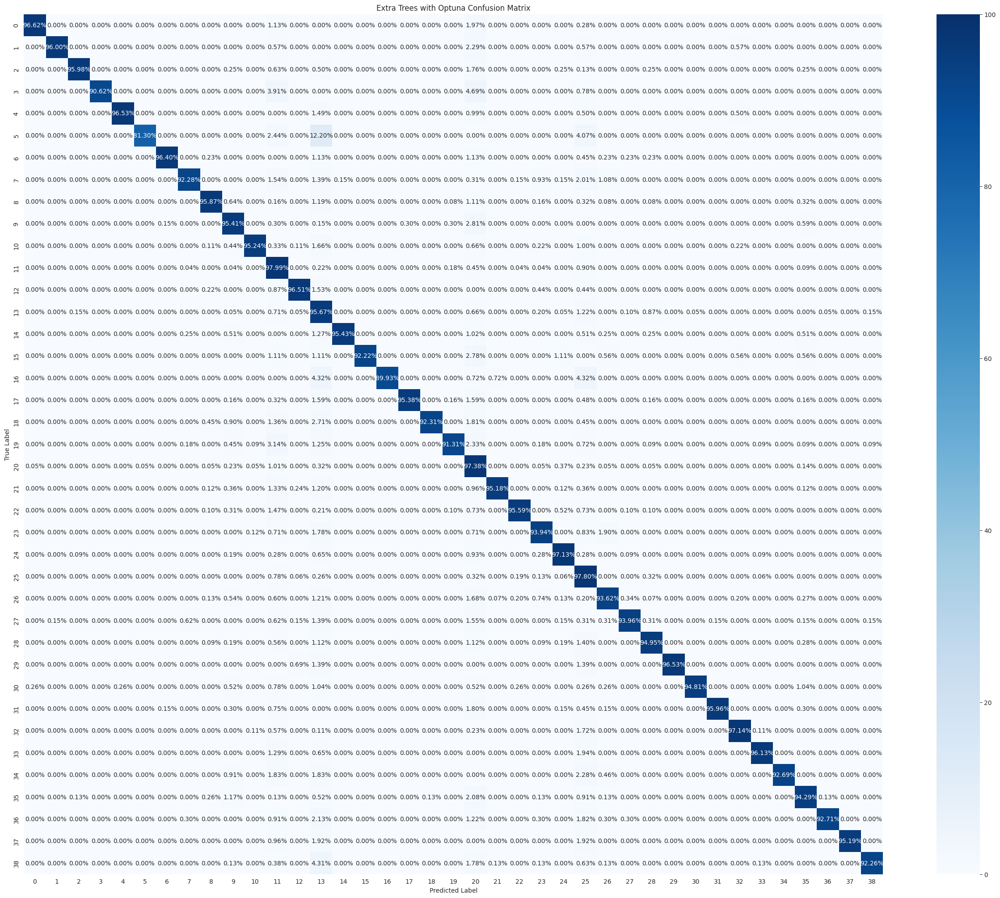

In [84]:
hf.confusion_matrix_plot(y_test, etc_section.predict(X_test), 'Extra Trees with Optuna', 'Section/ExtraTrees_cm_optuna', figsize=(31,25))

### XGBoost

In [85]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit the encoder to the class labels and transform them to numeric labels
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.fit_transform(y_test)

In [86]:
xgboost = XGBClassifier(use_label_encoder=False, n_jobs=-1, random_state=33)
xgboost.fit(X_train, y_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [87]:
xgboost.score(X_test, y_test_encoded)

0.9647620732354502

In [88]:
print(classification_report(y_test_encoded, xgboost.predict(X_test)))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       355
           1       0.99      0.98      0.99       175
           2       0.99      0.97      0.98       797
           3       1.00      0.95      0.97       128
           4       0.99      0.97      0.98       202
           5       0.97      0.91      0.94       123
           6       0.98      0.98      0.98       444
           7       0.95      0.96      0.95       648
           8       0.97      0.97      0.97      1259
           9       0.96      0.94      0.95       676
          10       0.98      0.98      0.98       903
          11       0.95      0.97      0.96      2234
          12       0.98      0.98      0.98       459
          13       0.94      0.96      0.95      1961
          14       0.98      0.96      0.97       394
          15       0.97      0.94      0.95       180
          16       1.00      0.95      0.97       139
          17       0.98    

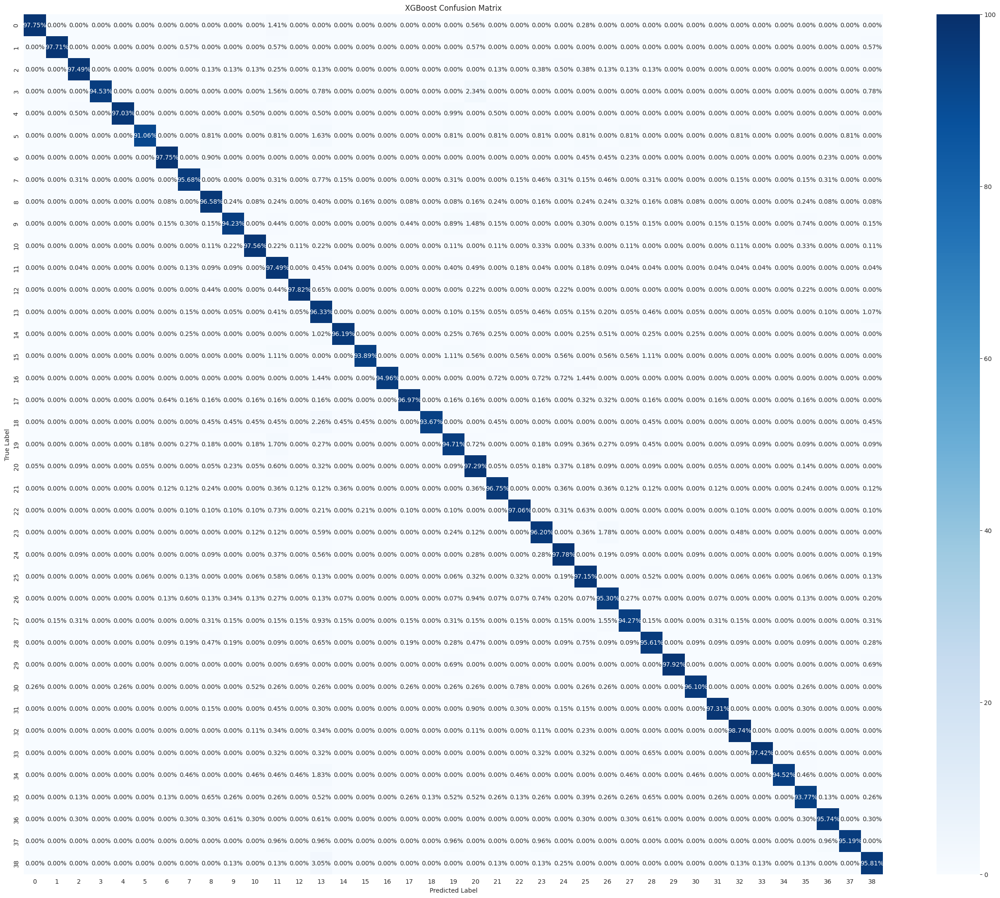

In [89]:
hf.confusion_matrix_plot(y_test_encoded, xgboost.predict(X_test), 'XGBoost', 'Section/XGBoost_cm', figsize=(31,25))

In [90]:
def objective_xgb_section(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.1, 10),
        'subsample': trial.suggest_float('subsample', 0.3, 0.6),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'lambda': trial.suggest_float('lambda', 0, 10),
        'alpha': trial.suggest_float('alpha', 0, 10),
        'objective': 'multi:softmax',
        'num_class': 6,
        'eval_metric': 'mlogloss',
    }
    
    xgboost = XGBClassifier(**params, n_jobs=-1, random_state=33)
    score = cross_val_score(xgboost, X_train, y_train_encoded, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [91]:
study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgb_section, n_trials=10)

[I 2024-09-20 01:56:25,819] A new study created in memory with name: no-name-c7aaec98-eb39-4197-ba14-476a14e18125
[I 2024-09-20 01:59:17,915] Trial 0 finished with value: 0.9329785136999802 and parameters: {'n_estimators': 250, 'max_depth': 9, 'learning_rate': 0.0480294456848617, 'min_child_weight': 7, 'gamma': 8.693216248041162, 'subsample': 0.5160497206627367, 'colsample_bytree': 0.8374121329391413, 'lambda': 3.9728882560176606, 'alpha': 9.18148834441073}. Best is trial 0 with value: 0.9329785136999802.
[I 2024-09-20 02:03:03,451] Trial 1 finished with value: 0.9464586271209571 and parameters: {'n_estimators': 250, 'max_depth': 6, 'learning_rate': 0.03778534351706739, 'min_child_weight': 9, 'gamma': 2.002099036096705, 'subsample': 0.3121119359845834, 'colsample_bytree': 0.7178840035800322, 'lambda': 4.039531712254925, 'alpha': 4.685718934404517}. Best is trial 1 with value: 0.9464586271209571.
[I 2024-09-20 02:03:53,830] Trial 2 finished with value: 0.9149645938528256 and parameters:

In [92]:
print('Best trial:')
trial = study_xgb.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.94849050023503
Params: 
  n_estimators: 250
  max_depth: 9
  learning_rate: 0.02973965604201139
  min_child_weight: 2
  gamma: 4.027012938201235
  subsample: 0.5647163791453647
  colsample_bytree: 0.5744429610969088
  lambda: 5.204845543989565
  alpha: 4.964383935079079


In [93]:
trials_df = study_xgb.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_alpha,params_colsample_bytree,params_gamma,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,state
4,4,0.948491,2024-09-20 02:06:07.420897,2024-09-20 02:10:07.972911,0 days 00:04:00.552014,4.964384,0.574443,4.027013,5.204846,0.029740,9,2,250,0.564716,COMPLETE
1,1,0.946459,2024-09-20 01:59:17.916345,2024-09-20 02:03:03.450706,0 days 00:03:45.534361,4.685719,0.717884,2.002099,4.039532,0.037785,6,9,250,0.312112,COMPLETE
5,5,0.941136,2024-09-20 02:10:07.974634,2024-09-20 02:11:49.892002,0 days 00:01:41.917368,4.000026,0.599402,2.940410,2.431762,0.045911,7,5,100,0.327680,COMPLETE
3,3,0.937164,2024-09-20 02:03:53.831246,2024-09-20 02:06:07.419749,0 days 00:02:13.588503,0.048704,0.842514,4.965702,5.502681,0.035482,4,6,150,0.358049,COMPLETE
0,0,0.932979,2024-09-20 01:56:25.820714,2024-09-20 01:59:17.915120,0 days 00:02:52.094406,9.181488,0.837412,8.693216,3.972888,0.048029,9,7,250,0.516050,COMPLETE


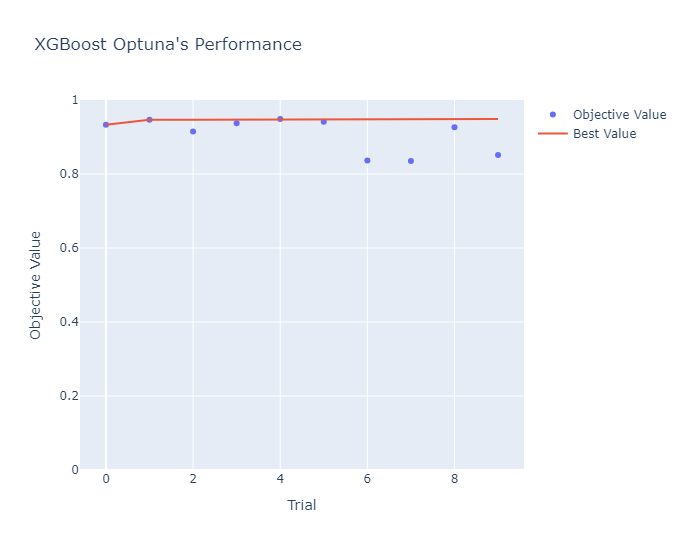

In [94]:
fig = plot_optimization_history(study_xgb)
fig.update_layout(yaxis_range=[0, 1], title="XGBoost Optuna's Performance", width=930, height=550)
fig.show()

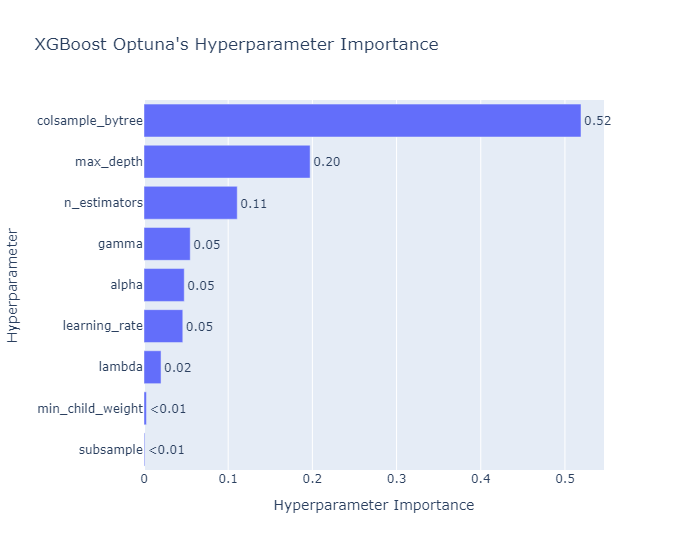

In [95]:
fig = plot_param_importances(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

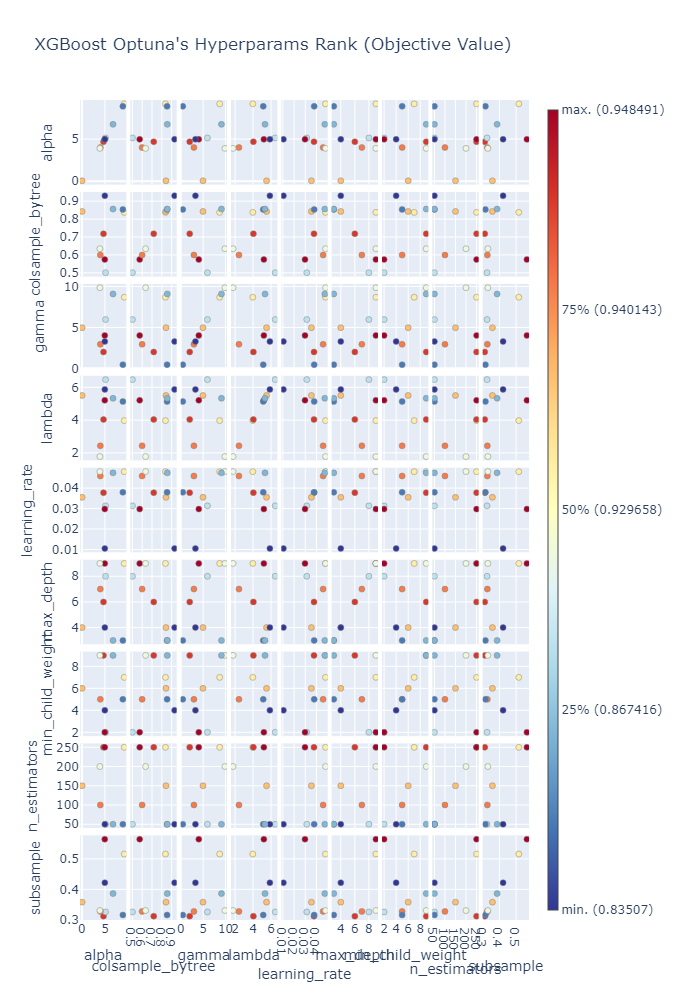

In [96]:
fig = plot_rank(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparams Rank (Objective Value)", width=1330, height=1000)
fig.show()

In [97]:
xgboost_section = XGBClassifier(**study_xgb.best_trial.params, n_jobs=-1, random_state=33)
xgboost_section.fit(X_train, y_train_encoded)

XGBClassifier(alpha=4.964383935079079, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5744429610969088, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=4.027012938201235,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=5.204845543989565,
              learning_rate=0.02973965604201139, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=2, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=250, n_jobs=-1, ...)

In [98]:
xgboost_section.score(X_test, y_test_encoded)

0.9533698920926942

In [99]:
print(classification_report(y_test_encoded, xgboost_section.predict(X_test)))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       355
           1       0.99      0.95      0.97       175
           2       0.98      0.96      0.97       797
           3       1.00      0.91      0.95       128
           4       0.99      0.97      0.98       202
           5       0.98      0.90      0.94       123
           6       1.00      0.94      0.97       444
           7       0.95      0.93      0.94       648
           8       0.96      0.97      0.96      1259
           9       0.88      0.95      0.92       676
          10       0.99      0.97      0.98       903
          11       0.91      0.98      0.94      2234
          12       0.98      0.96      0.97       459
          13       0.89      0.95      0.92      1961
          14       0.99      0.95      0.97       394
          15       1.00      0.91      0.95       180
          16       1.00      0.94      0.97       139
          17       1.00    

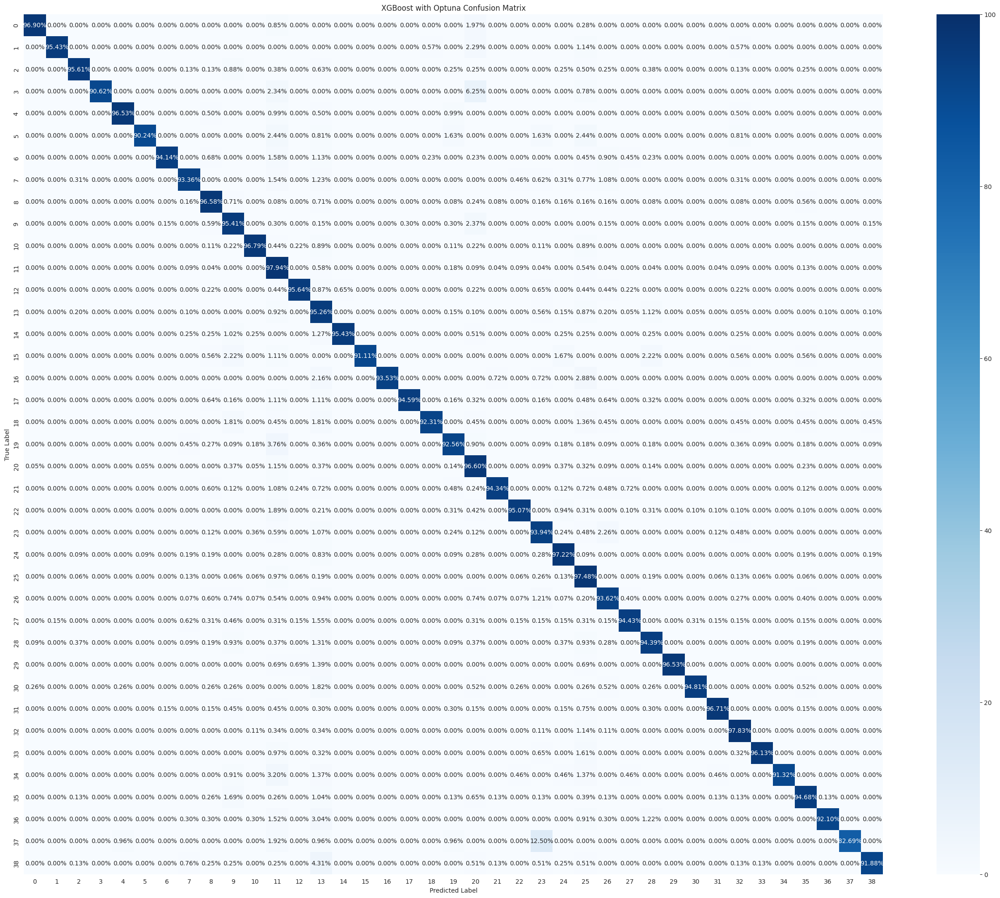

In [100]:
hf.confusion_matrix_plot(y_test_encoded, xgboost_section.predict(X_test), 'XGBoost with Optuna', 'Section/XGBoost_cm_optuna', figsize=(31,25))

### LightGBM

In [101]:
lgbm = LGBMClassifier(verbose=-1)
lgbm.fit(X_train, y_train)

LGBMClassifier(verbose=-1)

In [102]:
lgbm.score(X_test, y_test)

0.9654696621263046

In [103]:
print(classification_report(y_test, lgbm.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.99      0.97      0.98       355
                            SECTION I. EXISTENCE       0.97      0.97      0.97       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.99      0.98      0.98       797
                    SECTION I. MATTER IN GENERAL       0.98      0.95      0.97       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.99      0.97      0.98       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.95      0.90      0.93       123
                     SECTION I. SPACE IN GENERAL       0.99      0.98      0.99       444
                  SECTION I. VOLITION IN GENERAL       0.95      0.96      0.96       648
                          SECTION II. DIMENSIONS       0.97      0.97      0.97      1259
                    SECTION II. INORGANIC MATTER       0.95      0.94      0.95       676
         

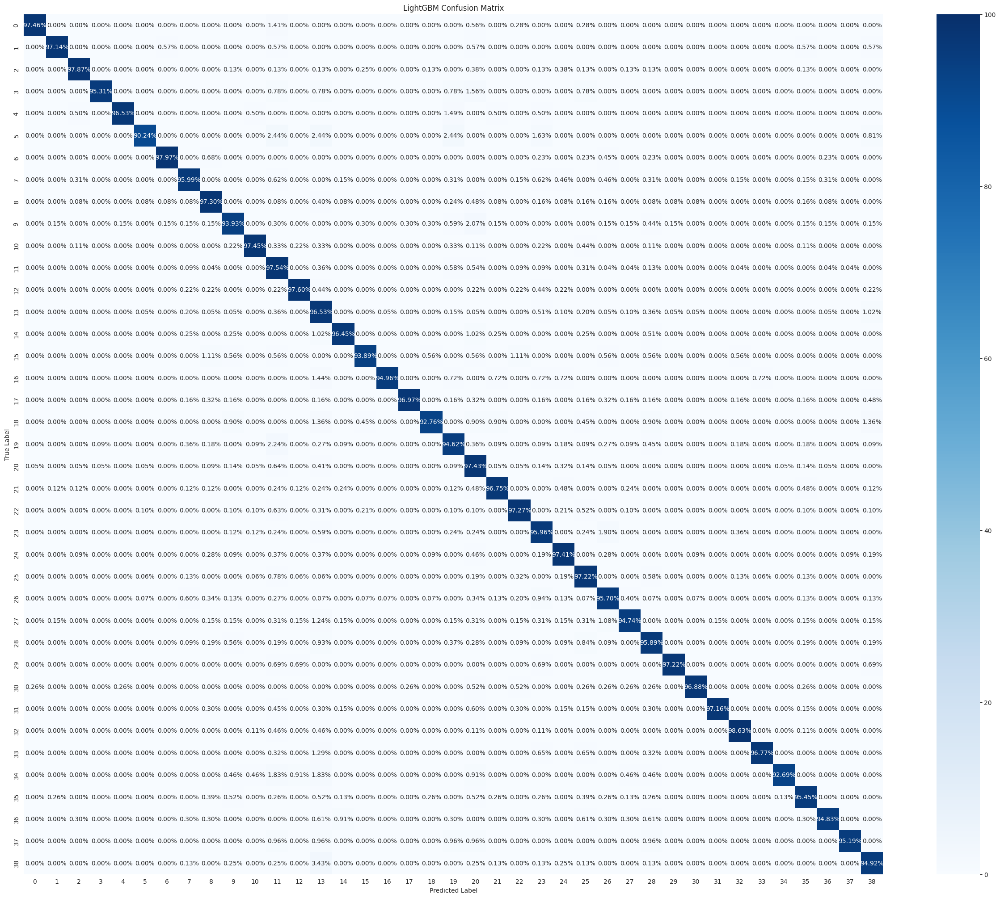

In [104]:
hf.confusion_matrix_plot(y_test, lgbm.predict(X_test), 'LightGBM', 'Section/LightGBM_cm', figsize=(31,25))

In [105]:
def objective_lgbm_section(trial):
    params = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        # 'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'max_depth': trial.suggest_int('max_depth', -1, 20, 2),
        'num_leaves': trial.suggest_int('num_leaves', 20, 300),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 25),
        'subsample': trial.suggest_float('subsample', 0.2, 0.3),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.2, 0.3),
        # 'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 10.0),  # L1 regularization
        # 'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 10.0),  # L2 regularization
        'n_jobs': -1,
        'verbose': -1,
    }

    # Create and fit the model
    lgbm = LGBMClassifier(**params)
    score = cross_val_score(lgbm, X_train, y_train, cv=2, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [106]:
study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(objective_lgbm_section, n_trials=10)

[I 2024-09-20 02:18:11,998] A new study created in memory with name: no-name-31e5c125-263a-4442-b44f-7fd7ba331a3a
[I 2024-09-20 02:25:18,621] Trial 0 finished with value: 0.9605907546888437 and parameters: {'n_estimators': 100, 'max_depth': 15, 'num_leaves': 140, 'min_child_samples': 21, 'subsample': 0.28107014586527923, 'colsample_bytree': 0.2678906927719809}. Best is trial 0 with value: 0.9605907546888437.
[I 2024-09-20 02:30:41,944] Trial 1 finished with value: 0.9611972835169189 and parameters: {'n_estimators': 200, 'max_depth': 17, 'num_leaves': 34, 'min_child_samples': 21, 'subsample': 0.20009730865374759, 'colsample_bytree': 0.2903425380889581}. Best is trial 1 with value: 0.9611972835169189.
[I 2024-09-20 02:36:23,592] Trial 2 finished with value: 0.218911159494192 and parameters: {'n_estimators': 100, 'max_depth': 17, 'num_leaves': 265, 'min_child_samples': 14, 'subsample': 0.2446290051403655, 'colsample_bytree': 0.20018115190766061}. Best is trial 1 with value: 0.961197283516

In [107]:
print('Best trial:')
trial = study_lgbm.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.9611972835169189
Params: 
  n_estimators: 200
  max_depth: 17
  num_leaves: 34
  min_child_samples: 21
  subsample: 0.20009730865374759
  colsample_bytree: 0.2903425380889581


In [108]:
trials_df = study_lgbm.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_colsample_bytree,params_max_depth,params_min_child_samples,params_n_estimators,params_num_leaves,params_subsample,state
1,1,0.961197,2024-09-20 02:25:18.622177,2024-09-20 02:30:41.944314,0 days 00:05:23.322137,0.290343,17,21,200,34,0.200097,COMPLETE
5,5,0.960955,2024-09-20 02:40:09.890797,2024-09-20 02:47:11.793128,0 days 00:07:01.902331,0.236956,-1,20,150,143,0.254266,COMPLETE
0,0,0.960591,2024-09-20 02:18:11.999126,2024-09-20 02:25:18.620914,0 days 00:07:06.621788,0.267891,15,21,100,140,0.281070,COMPLETE
8,8,0.930007,2024-09-20 02:52:33.611853,2024-09-20 02:54:05.115594,0 days 00:01:31.503741,0.285901,1,10,250,143,0.267593,COMPLETE
4,4,0.571815,2024-09-20 02:38:06.331613,2024-09-20 02:40:09.889847,0 days 00:02:03.558234,0.296191,7,5,100,275,0.229928,COMPLETE


In [109]:
fig = plot_optimization_history(study_lgbm)
fig.update_layout(yaxis_range=[0, 1], title="LGBM Optuna's Performance", width=930, height=550)
fig.show()

In [110]:
fig = plot_param_importances(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

In [111]:
fig = plot_rank(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparams Rank (Objective Value)", width=1030, height=1000)
fig.show()

In [112]:
lgbm_section = LGBMClassifier(**study_lgbm.best_trial.params)
lgbm_section.fit(X_train, y_train)

LGBMClassifier(colsample_bytree=0.2903425380889581, max_depth=17,
               min_child_samples=21, n_estimators=200, num_leaves=34,
               subsample=0.20009730865374759)

In [113]:
lgbm_section.score(X_test, y_test)

0.25961436405448435

In [114]:
print(classification_report(y_test, lgbm_section.predict(X_test)))

                                                  precision    recall  f1-score   support

                SECTION I. AFFECTIONS IN GENERAL       0.35      0.10      0.16       355
                            SECTION I. EXISTENCE       0.17      0.25      0.20       175
         SECTION I. GENERAL INTERSOCIAL VOLITION       0.64      0.32      0.42       797
                    SECTION I. MATTER IN GENERAL       0.79      0.09      0.15       128
         SECTION I. NATURE OF IDEAS COMMUNICATED       0.37      0.17      0.23       202
   SECTION I. OPERATIONS OF INTELLECT IN GENERAL       0.15      0.13      0.14       123
                     SECTION I. SPACE IN GENERAL       0.83      0.01      0.02       444
                  SECTION I. VOLITION IN GENERAL       0.15      0.41      0.22       648
                          SECTION II. DIMENSIONS       0.14      0.19      0.16      1259
                    SECTION II. INORGANIC MATTER       0.29      0.06      0.10       676
         

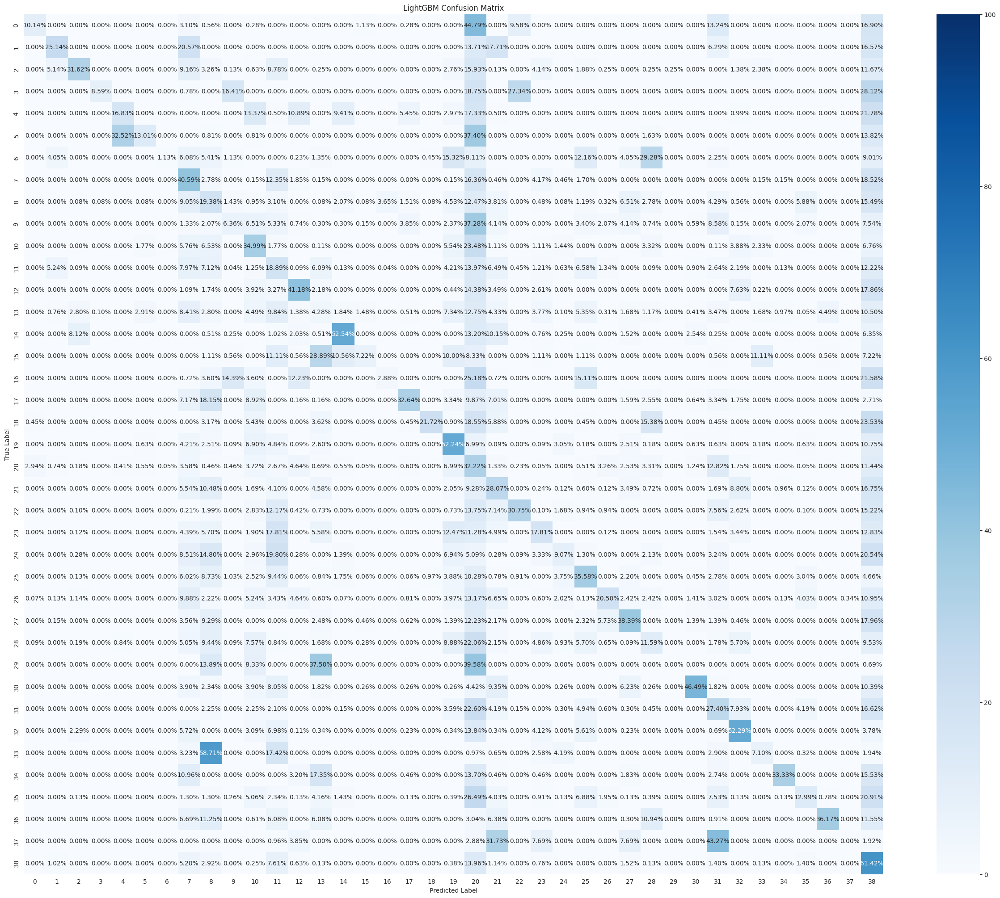

In [115]:
hf.confusion_matrix_plot(y_test, lgbm_section.predict(X_test), 'LightGBM', 'Section/LightGBM_cm_optuna', figsize=(31,25))

## 5. ML Comparison

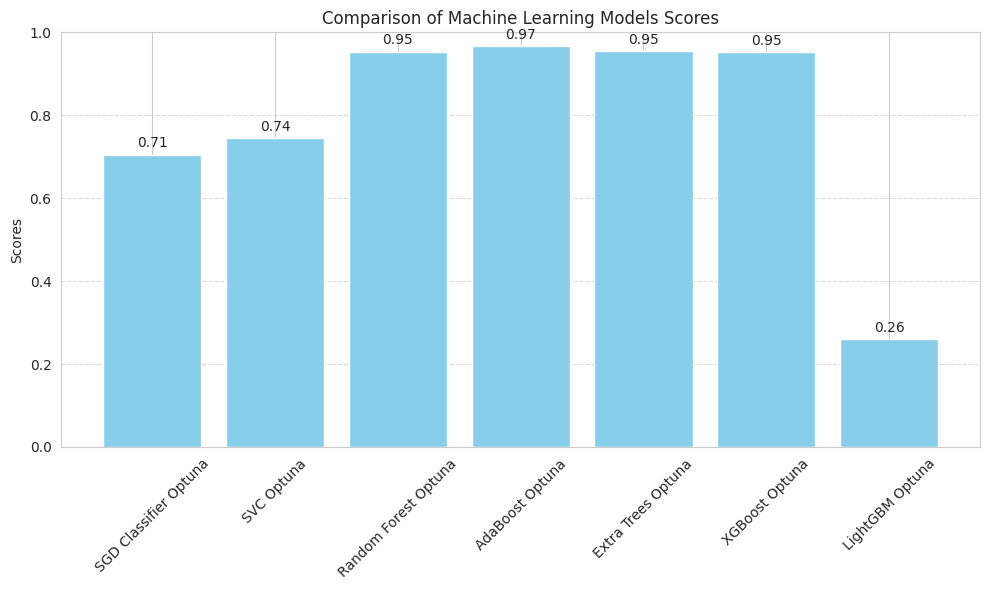

In [116]:
model_objects = {
    'SGD Classifier Optuna': sgd_section,
    'SVC Optuna': svc_section,
    'Random Forest Optuna': rf_section,
    'AdaBoost Optuna': adaboost_section,
    'Extra Trees Optuna': etc_section,
    'XGBoost Optuna': xgboost_section,
    'LightGBM Optuna': lgbm_section
}

# Extract scores for each model
model_names = []
scores = []

for model_name, model in model_objects.items():
    if model_name != 'XGBoost Optuna':
        score = model.score(X_test, y_test)
        model_names.append(model_name)
        scores.append(score)
    else:
        score = model.score(X_test, y_test_encoded)
        model_names.append(model_name)
        scores.append(score)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(model_names, scores, color='skyblue')
plt.xlabel(None)
plt.ylabel('Scores')
plt.title('Comparison of Machine Learning Models Scores')
plt.ylim(0, 1)  # Assuming scores are between 0 and 1
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add score values on top of the bars
for i, score in enumerate(scores):
    plt.text(i, score + 0.01, f'{score:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('Figures/Modeling Section/Machine_Learning_results_with_optuna.png')
plt.show()

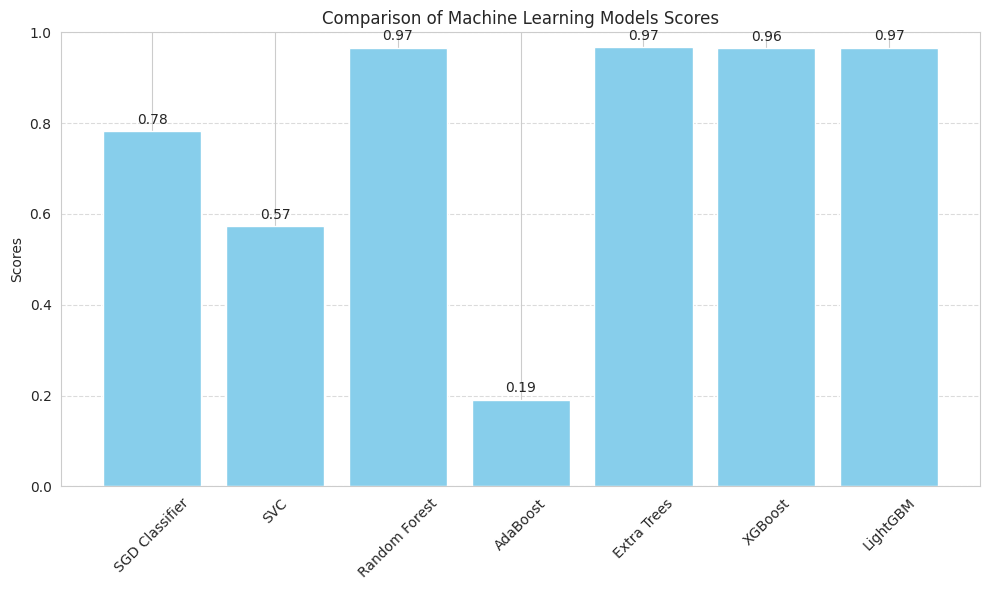

In [117]:
model_objects = {
    'SGD Classifier': sgd,
    'SVC': svc,
    'Random Forest': rf,
    'AdaBoost': adaboost,
    'Extra Trees': etc,
    'XGBoost': xgboost,
    'LightGBM': lgbm
}

# Extract scores for each model
model_names = []
scores = []

for model_name, model in model_objects.items():
    if model_name != 'XGBoost':
        score = model.score(X_test, y_test)
        model_names.append(model_name)
        scores.append(score)
    else:
        score = model.score(X_test, y_test_encoded)
        model_names.append(model_name)
        scores.append(score)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(model_names, scores, color='skyblue')
plt.xlabel(None)
plt.ylabel('Scores')
plt.title('Comparison of Machine Learning Models Scores')
plt.ylim(0, 1)  # Assuming scores are between 0 and 1
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add score values on top of the bars
for i, score in enumerate(scores):
    plt.text(i, score + 0.01, f'{score:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('Figures/Modeling Section/Machine_Learning_results.png')
plt.show()

In [118]:
dump(lgbm, 'Models/Section/lgbm.joblib')

['Models/Section/lgbm.joblib']

In [119]:
dump(xgboost, 'Models/Section/xgboost.joblib')

['Models/Section/xgboost.joblib']